
# Illustration of transforms


This example illustrates some of the various transforms available in `the
torchvision.transforms.v2 module <transforms>`.


In [1]:
import matplotlib.pyplot as plt
import torch

def plot(images, row_title=None, **imshow_kwargs):
    """Displays a flat list or nested list of images or (image, boxes) pairs."""

    # Normalize to grid format: list of rows
    if isinstance(images[0], (list, tuple)) and not isinstance(images[0][0], (torch.Tensor, tuple)):
        grid = images  # Already a grid
    else:
        grid = [images]  # Convert flat to single-row grid

    num_rows = len(grid)
    num_cols = max(len(row) for row in grid)

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 5 * num_rows), squeeze=False)

    for i, row in enumerate(grid):
        for j, item in enumerate(row):
            ax = axs[i][j]
            if isinstance(item, tuple):
                img, boxes = item
            else:
                img, boxes = item, None

            if isinstance(img, torch.Tensor):
                img = img.detach()
                if img.ndim == 3 and img.shape[0] in (1, 3):
                    img = img.permute(1, 2, 0)  # C x H x W → H x W x C

            ax.imshow(img, **imshow_kwargs)
            ax.axis('off')

            if boxes is not None:
                for box in boxes.to('cpu'):
                    x0, y0, x1, y1 = box.tolist()
                    rect = plt.Rectangle((x0, y0), x1 - x0, y1 - y0, fill=False, edgecolor='red', linewidth=2)
                    ax.add_patch(rect)

        if row_title and i < len(row_title):
            axs[i][0].set_ylabel(row_title[i], fontsize=14)

    plt.tight_layout()
    plt.show()

In [2]:
!mkdir assets
!wget https://github.com/pytorch/vision/raw/main/gallery/assets/astronaut.jpg -O ./assets/astronaut.jpg

mkdir: cannot create directory ‘assets’: File exists
--2025-05-29 14:38:34--  https://github.com/pytorch/vision/raw/main/gallery/assets/astronaut.jpg
Resolving github.com (github.com)... 140.82.113.4
Connecting to github.com (github.com)|140.82.113.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/pytorch/vision/main/gallery/assets/astronaut.jpg [following]
--2025-05-29 14:38:34--  https://raw.githubusercontent.com/pytorch/vision/main/gallery/assets/astronaut.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40344 (39K) [image/jpeg]
Saving to: ‘./assets/astronaut.jpg’

./assets/astronaut. 100%[===================>]  39.40K  --.-KB/s    in 0.02s   

2025-05-29 14:38:34 (2.48 MB/s) - ‘./assets/

In [3]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt

import torch
from torchvision.transforms import v2

plt.rcParams["savefig.bbox"] = 'tight'

# if you change the seed, make sure that the randomly-applied transforms
# properly show that the image can be both transformed and *not* transformed!
torch.manual_seed(0)

# If you're trying to run that on Colab, you can download the assets and the
# helpers from https://github.com/pytorch/vision/tree/main/gallery/
# from helpers import plot

orig_img = Image.open(Path('./assets') / 'astronaut.jpg')

## Geometric Transforms
Geometric image transformation refers to the process of altering the geometric properties of an image,
such as its shape, size, orientation, or position.
It involves applying mathematical operations to the image pixels or coordinates to achieve the desired transformation.

### Pad
The :class:`~torchvision.transforms.Pad` transform
(see also :func:`~torchvision.transforms.functional.pad`)
pads all image borders with some pixel values.



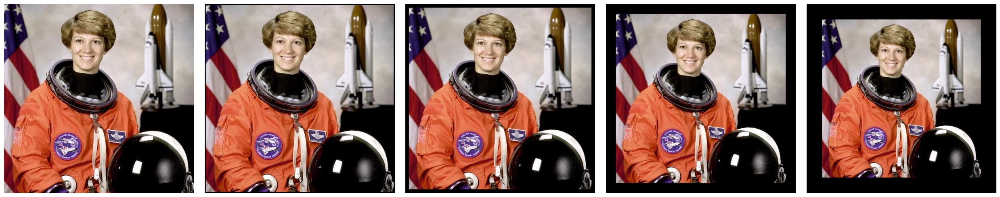

In [4]:
padded_imgs = [v2.Pad(padding=padding)(orig_img) for padding in (3, 10, 30, 50)]
plot([orig_img] + padded_imgs)

### Resize
The :class:`~torchvision.transforms.Resize` transform
(see also :func:`~torchvision.transforms.functional.resize`)
resizes an image.



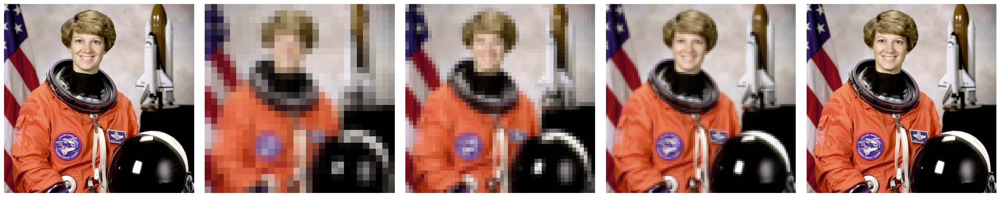

In [5]:
resized_imgs = [v2.Resize(size=size)(orig_img) for size in (30, 50, 100, orig_img.size)]
plot([orig_img] + resized_imgs)

### CenterCrop
The :class:`~torchvision.transforms.CenterCrop` transform
(see also :func:`~torchvision.transforms.functional.center_crop`)
crops the given image at the center.



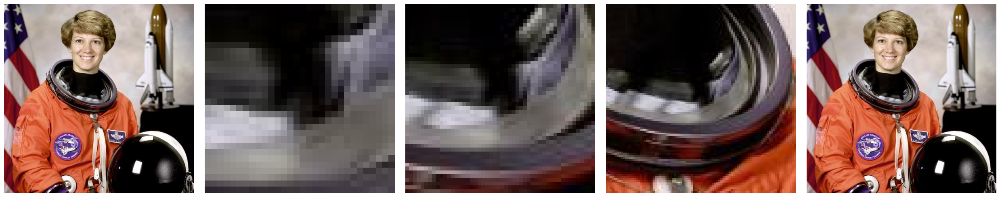

In [6]:
center_crops = [v2.CenterCrop(size=size)(orig_img) for size in (30, 50, 100, orig_img.size)]
plot([orig_img] + center_crops)

### FiveCrop
The :class:`~torchvision.transforms.FiveCrop` transform
(see also :func:`~torchvision.transforms.functional.five_crop`)
crops the given image into four corners and the central crop.



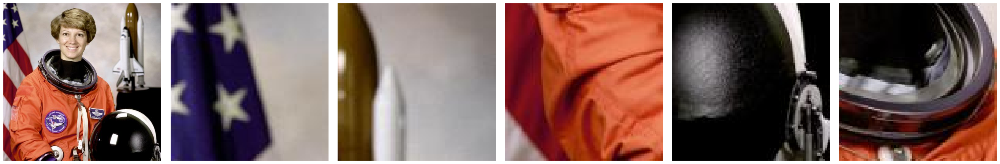

In [7]:
(top_left, top_right, bottom_left, bottom_right, center) = v2.FiveCrop(size=(100, 100))(orig_img)
plot([orig_img] + [top_left, top_right, bottom_left, bottom_right, center])

### RandomPerspective
The :class:`~torchvision.transforms.RandomPerspective` transform
(see also :func:`~torchvision.transforms.functional.perspective`)
performs random perspective transform on an image.



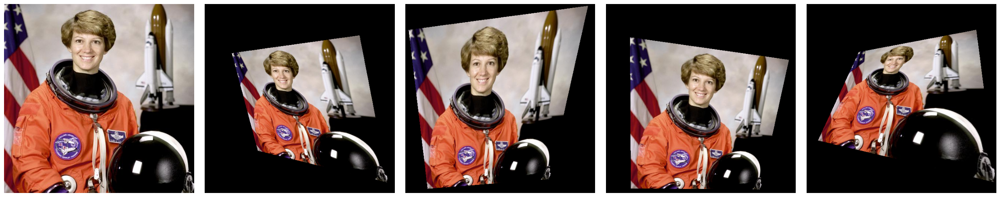

In [8]:
perspective_transformer = v2.RandomPerspective(distortion_scale=0.6, p=1.0)
perspective_imgs = [perspective_transformer(orig_img) for _ in range(4)]
plot([orig_img] + perspective_imgs)

### RandomRotation
The :class:`~torchvision.transforms.RandomRotation` transform
(see also :func:`~torchvision.transforms.functional.rotate`)
rotates an image with random angle.



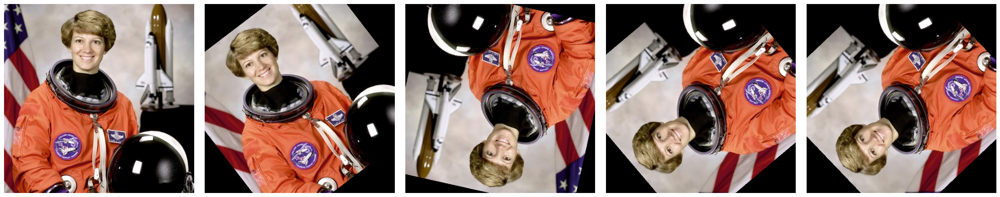

In [9]:
rotater = v2.RandomRotation(degrees=(0, 180))
rotated_imgs = [rotater(orig_img) for _ in range(4)]
plot([orig_img] + rotated_imgs)

### RandomAffine
The :class:`~torchvision.transforms.RandomAffine` transform
(see also :func:`~torchvision.transforms.functional.affine`)
performs random affine transform on an image.



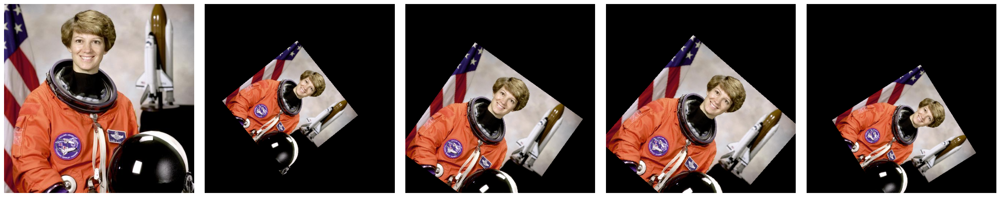

In [10]:
affine_transfomer = v2.RandomAffine(degrees=(30, 70), translate=(0.1, 0.3), scale=(0.5, 0.75))
affine_imgs = [affine_transfomer(orig_img) for _ in range(4)]
plot([orig_img] + affine_imgs)

### ElasticTransform
The :class:`~torchvision.transforms.ElasticTransform` transform
(see also :func:`~torchvision.transforms.functional.elastic_transform`)
Randomly transforms the morphology of objects in images and produces a
see-through-water-like effect.



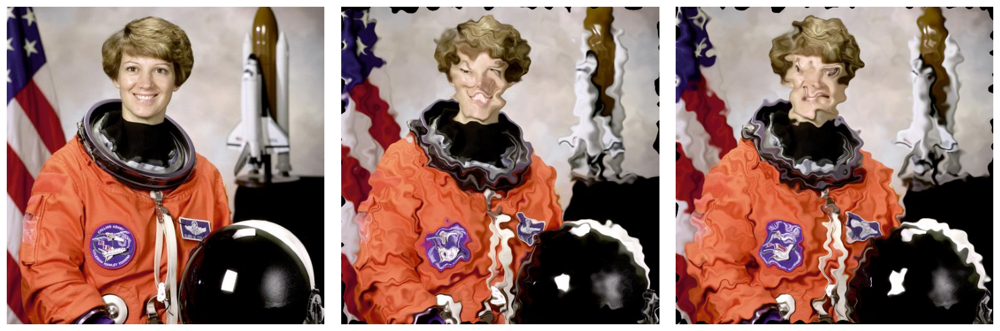

In [11]:
elastic_transformer = v2.ElasticTransform(alpha=250.0)
transformed_imgs = [elastic_transformer(orig_img) for _ in range(2)]
plot([orig_img] + transformed_imgs)

### RandomCrop
The :class:`~torchvision.transforms.RandomCrop` transform
(see also :func:`~torchvision.transforms.functional.crop`)
crops an image at a random location.



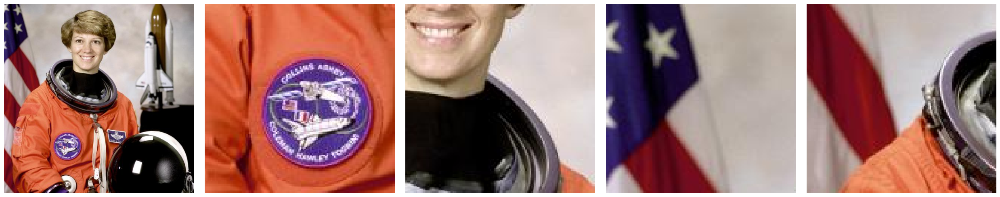

In [12]:
cropper = v2.RandomCrop(size=(128, 128))
crops = [cropper(orig_img) for _ in range(4)]
plot([orig_img] + crops)

### RandomResizedCrop
The :class:`~torchvision.transforms.RandomResizedCrop` transform
(see also :func:`~torchvision.transforms.functional.resized_crop`)
crops an image at a random location, and then resizes the crop to a given
size.



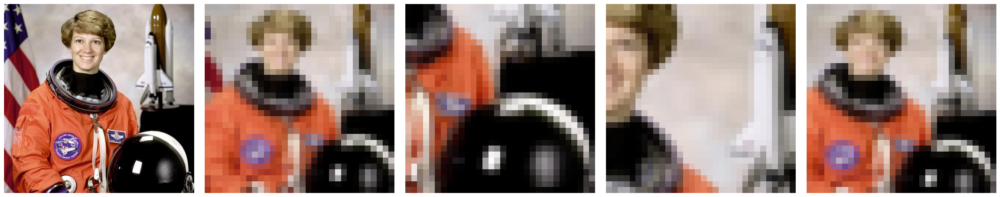

In [13]:
resize_cropper = v2.RandomResizedCrop(size=(32, 32))
resized_crops = [resize_cropper(orig_img) for _ in range(4)]
plot([orig_img] + resized_crops)